# Exercise 1 : Velocity Distributions
**Due on 27.10.23**

## Background:

Irrespective of the start conditions, velocity distributions in multi-particle systems with collisions between particles converge to a Maxwell-Boltzmann distribution. You will investigate this effect by creating your own simulation of a multi-particle systems of hard spheres in a 2D-box.

**Solution**

The solution starts by importing the required packages. In addition to the basic packages like numpy and matplotlib, a custom module `ccs_basis.py` is also defined, which defines relevant functions from the `solution_basis.ipynb` notebook. This custom module will be updated throughout the course so as to help in the final project.

The basic imports like `numpy`, `matplotlib` and `scipy` are also planned to be merged to the `ccs_basis` module import in later assignments.

To maintain a standard plotting style across all assignments, the `ccs_ex.mplstyle` template is also set up, which defines some basic parameters for the figure like font type, font sizes and grid.

In [1]:
# Numpy and matplotlib for basic numerical operations 
# and plotting respectively.

import numpy as np
import matplotlib.pyplot as plt

# Scientific constants from scipy, in case we need to use
# some standard values like the Boltzmann constant kB.
import scipy.constants as sc

import sys

sys.path.append('..')
from ccs_basis import *

plt.style.use('../ccs_ex.mplstyle')

## Task I: Implementation

- We start with the code for a single particle moving in a box provided before.
- The first task is to come up with a “*periodic boundary condition*” algorithm: if a particle leaves one side of the box, it re-enters the box on the other side. 

In [2]:
# We define a particle of 0.5nm radius, random coordinates
# and random velocities of magnitude 0.5 nm/timestep.
box = [20,20]
p = Particle(r=0.5, x=np.random.uniform(0, box[0]), y=np.random.uniform(0, box[1]), vx=np.random.uniform(-0.5, 0.5), vy=np.random.uniform(-0.5, 0.5))
print(p)

This is a particle at 15.47, 0.30 with v=0.13,0.06 nm/timestep


The periodic boundary condition:

- If the particle reaches the left/bottom end of the box, it is to return from the right/top end. 
*i.e.,* $$ x = 0 \longmapsto x=20 $$,
$$ x = -0.5 \longmapsto x = 19.5$$ 
and so on. 

The code checks this condition and updates the position of the particle by adding the size of the box to the respective coordinate. 

- Conversely, when the particle reaches the right/top end, it is to return from the left/bottom end. 
*i.e.,* $$ x = 20.5 \longmapsto x=0.5 $$,
$$ x = 21.0 \longmapsto x = 1.0$$ 
and so on. 

This is achieved by using the modulo operation `%`.
$$ 20.5\% 20 = 0.5, \quad 21.0\%20 =1.0 %


In [8]:
def periodic_bound(p,box):
    if (p.x + p.r) <= p.r:
        p.x += box[0]
    if (p.y + p.r) <= p.r:
        p.y += box[1]
        
    if (p.x + p.r) >= box[0]:
        p.x = p.x%box[0]
    if (p.y + p.r) >= box[1]:
        p.y = p.y%box[1]
    
    return p

The functions `init` and `animate`, which are copied from the `solution_basis` notebook verbatim, for some reason, needs to be defined due to be defined in the same notebook itself, and not in the custom module mentioned above. Importing these functions from the module gives an error. 

(Asking ChatGPT about this, it says that this is a common issue related to variable scope. Since I am currently unable to fix this issue, as a workaround, I am simply redefining these functions in this notebook.)

In [6]:
def init():
    dot.set_data([], [])
    return (dot,)

def animate(i):
    x = data_traj[0,i]
    y = data_traj[1,i]
    dot.set_data(x, y)
    return (dot,)

A custom function to set up figure parameters like title, limits, xlabel, ylabel.

In [5]:
def setup_fig_box(fig,ax,box,title,xlabel=r'Position $x$',ylabel=r'Position $y$'):
    fig.suptitle(title)
    ax.set_xlim(0,box[0])
    ax.set_ylim(0,box[1])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    return fig,ax

In [9]:
steps = 2000

# The array to store the trajectory data, same as from
# the solution_basis. 
data_traj = np.zeros((4,steps)) # 4 -> x,y,vx,vy

# At each step, the periodic boundary condition is checked 
# first, followed by a motion specified by the `move` 
# function, according to the position and velocity direction 
# of the particle.

for i in range(steps):
    periodic_bound(p,box)
    move(p,1)
    data_traj[:,i] = [p.x, p.y, p.vx, p.vy]

fig,ax = plt.subplots()

fig,ax = setup_fig_box(fig,ax,box,'Single particle with Periodic Boundary Conditions',r'Position $x$',r'Position $y$')

dot = ax.plot([], [], 'bo')[0]

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=1000, interval=20, blit=True)

plt.close(fig) # this is not really important; it is only to
# suppress the blank canvas from being output when the 
# figure is defined using plt.subplots().

HTML(anim.to_html5_video())

/tmp/ipykernel_35809/1454688866.py:8: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  dot.set_data(x, y)


The periodic boundary condition works as required.

- Now the code is to be extended to allow the calculation of a trajectory of a *multi-particle system*.
- To do this, we need an algorithm to take into account elastic collisions of hard spheres.
- For this, we initially need to define a function that *checks* if such a collision is happening (“nearest neighbor search”) after a jump in time.

To simplify the problem, define first a system with just two particles instead of one:

### Two particles instead of one

Before starting the code, some more functions to ease the process of particle initialization:

In [4]:
def rand_velocity(velocity_magnitude):
    # to get a random velocity value in different directions
    # but with the same magnitude
    return np.random.uniform(-velocity_magnitude, velocity_magnitude)

def rand_coordinate(box_size):
    # here box_sizes is to be given as a single number,
    # assuming a square box
    return np.random.uniform(0,box_size)

Before handling the case of collision, to better understand how to modify the functions in the `solution_basis` notebook for multi-particle system, I create the following two-particle animation:

In [13]:
p1 = Particle(r=0.5, x=rand_coordinate(box[0]), y=rand_coordinate(box[0]), vx=rand_velocity(0.5), vy=rand_velocity(0.5))
p2 = Particle(r=0.5, x=rand_coordinate(box[0]), y=rand_coordinate(box[0]), vx=rand_velocity(0.5), vy=rand_velocity(0.5))

# first we initialize plot canvas :
fig, ax = plt.subplots()

fig,ax = setup_fig_box(fig,ax,box,'Two-particles without collision handling')
# fig.suptitle('Two-particles without collision handling')
# ax.set_xlim(0, box[0])
# ax.set_ylim(0, box[1])

# and now create two dots for the two particles
dot1, = ax.plot([], [], 'bo')
dot2, = ax.plot([], [], 'ro')

# separate trajectory arrays for both particles:
data_traj1 = np.zeros((4,steps))
data_traj2 = np.zeros((4,steps))

for i in range(steps):
    periodic_bound(p1,box) # checks PBC for p1
    periodic_bound(p2,box) # checks PBC for p2
    move(p1,1) # moves p1
    move(p2,1) # moves p2
    # update the trajectories as:
    data_traj1[:,i] = [p1.x, p1.y, p1.vx, p1.vy] 
    data_traj2[:,i] = [p2.x, p2.y, p2.vx, p2.vy]

# new init function for two dots:
def init():
    dot1.set_data([], [])
    dot2.set_data([], [])
    return (dot1, dot2)

# new animate function for two dots:
def animate(i):
    x1 = data_traj1[0, i]
    y1 = data_traj1[1, i]
    dot1.set_data(x1, y1)
    
    x2 = data_traj2[0, i]
    y2 = data_traj2[1, i]
    dot2.set_data(x2, y2)
    
    return (dot1, dot2)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=1000, interval=20, blit=True)
plt.close(fig)

HTML(anim.to_html5_video())

/tmp/ipykernel_35809/3948164749.py:39: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  dot1.set_data(x1, y1)
/tmp/ipykernel_35809/3948164749.py:43: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  dot2.set_data(x2, y2)


It works! :)

### Handling Collisions

Now the 'nearest-neighbour search' is to be implemented. This can be done by checking the distance between each pair of particles at each step, and if the particles touch or overlap, the collision algorithm is initialized.

For handling the elastic collisions, the following formula ([source](https://en.wikipedia.org/wiki/Elastic_collision#Two-dimensional_collision_with_two_moving_objects)) is used:

$$\begin{aligned}
\mathbf {v} '_{1}&=\mathbf {v} _{1}-{\frac {2m_{2}}{m_{1}+m_{2}}}\ {\frac {\langle \mathbf {v} _{1}-\mathbf {v} _{2},\,\mathbf {x} _{1}-\mathbf {x} _{2}\rangle }{\|\mathbf {x} _{1}-\mathbf {x} _{2}\|^{2}}}\ (\mathbf {x} _{1}-\mathbf {x} _{2}),\\
\mathbf {v} '_{2}&=\mathbf {v} _{2}-{\frac {2m_{1}}{m_{1}+m_{2}}}\ {\frac {\langle \mathbf {v} _{2}-\mathbf {v} _{1},\,\mathbf {x} _{2}-\mathbf {x} _{1}\rangle }{\|\mathbf {x} _{2}-\mathbf {x} _{1}\|^{2}}}\ (\mathbf {x} _{2}-\mathbf {x} _{1})
\end{aligned}$$

In [3]:
def is_colliding(p1, p2):
    # distance check
    distance = np.sqrt((p1.x - p2.x)**2 + (p1.y - p2.y)**2)
    # returns True if distance is less than or equal to
    #  the sum of the radii of the two particles
    return distance <= (p1.r + p2.r)

def elastic_collision(p1, p2):
    # packing the positions and velocities as vectors:
    r1, r2 = np.array([p1.x, p1.y]), np.array([p2.x, p2.y])
    v1, v2 = np.array([p1.vx, p1.vy]), np.array([p2.vx, p2.vy])

    d = np.linalg.norm(r1 - r2)**2
    
    # the final velocities as per the formula
    u1 = v1 - np.dot(v1 - v2, r1 - r2) / d * (r1 - r2)
    u2 = v2 - np.dot(v2 - v1, r2 - r1) / d * (r2 - r1)

    # unpacking the final velocity vector:
    p1.vx, p1.vy = u1
    p2.vx, p2.vy = u2

    return p1, p2


Running the two-particle simulation again, this time with the collision handling algorithm:

In [18]:
p1 = Particle(r=0.5, x=5, y=10, vx=0.3, vy=0.1)
p2 = Particle(r=0.5, x=15, y=5, vx=-0.4, vy=-0.1)

steps = 2000
box = [20,20]

fig, ax = plt.subplots()
fig, ax = setup_fig_box(fig,ax,box,'Two-particle system with collision handling')

# Create two dots for two particles
dot1, = ax.plot([], [], 'o')
dot2, = ax.plot([], [], 'o')

data_traj1 = np.zeros((4,steps))
data_traj2 = np.zeros((4,steps))

for i in range(steps):
    periodic_bound(p1,box)
    periodic_bound(p2,box)
    move(p1,1)
    move(p2,1)

    # CHECKING COLLISION:
    if is_colliding(p1,p2):
        p1,p2 = elastic_collision(p1,p2)
        
    data_traj1[:,i] = [p1.x, p1.y, p1.vx, p1.vy]
    data_traj2[:,i] = [p2.x, p2.y, p2.vx, p2.vy]

def init():
    dot1.set_data([], [])
    dot2.set_data([], [])
    return (dot1, dot2)

def animate(i):
    x1 = [data_traj1[0, i]]
    y1 = [data_traj1[1, i]]
    dot1.set_data(x1, y1)
    
    x2 = [data_traj2[0, i]]
    y2 = [data_traj2[1, i]]
    dot2.set_data(x2, y2)
    
    return (dot1, dot2)


anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=1000, interval=20, blit=True)
plt.close(fig)
HTML(anim.to_html5_video())

## Task II: Simulation

- Create a 2D box with the dimensions 20x20 $\text{nm}^2$.

- Create 50 spherical particles with radius r = 0.5 nm (either at random positions or on a regular grid). All particles have the same mass, and therefore the absolute mass can be ignored.

- Assign a velocity $\vec{v}$ with $|\vec{v}|=0.5$ nm per numerical iteration step and random direction to each particle. 

- Use the same Euler integrator scheme as in the 1st exercise.

The major differences in extending the simulation to include more number of particles are:
 - Arrays are defined to store the particle objects and the marker `dots`. 
 - The `data_traj` array is modified to track the particle indices along with the trajectory. 
 
 For example, `data_traj[p,0,s]` will give the $x$-coordinate (second index of `data_traj` 0 means $x$, 1 means $y$, 2 is $v_x$ and 3 is $v_y$) of the `p`$^{th}$ particle (first index of `data_traj` indicates the particle index) at the `s`$^{th}$ step.

In [24]:
box = [20,20] # nm^2
num_particles = 50

particles = [] # list to store the particle objects
dots = [] # list to store the markers for each particle

fig, ax = plt.subplots()
fig, ax = setup_fig_box(fig,ax,box,'System with {0} particles'.format(num_particles))

for _ in range(num_particles):
    particles.append(Particle(r=0.5,x=rand_coordinate(box[0]),y=rand_coordinate(box[0]),vx=rand_velocity(0.5),vy=rand_velocity(0.5)))
    dots.append(ax.plot([], [], 'ro')[0])

data_traj = np.zeros((num_particles, 4, steps))

for i in range(steps):
    # at each time step:
    for j, p in enumerate(particles):
        # j - particle index
        # p - particle object
        periodic_bound(p, box)
        move(p, 1)
        # input the coordinates to trajectory:
        data_traj[j, :, i] = [p.x, p.y, p.vx, p.vy]

    # checking pairs of particles for collision
    # (Note: this loop was generated with the help of
    # ChatGPT)
    for j in range(num_particles):
        # j - again, particle index
        for k in range(j+1, num_particles):
            # k - loop over particles other than j
            if is_colliding(particles[j], particles[k]):
                particles[j], particles[k] = elastic_collision(particles[j], particles[k])

def init():
    for dot in dots:
        dot.set_data([], [])
    return dots

def animate(i):
    for j, dot in enumerate(dots):
        x = [data_traj[j, 0, i]]
        y = [data_traj[j, 1, i]]
        dot.set_data(x, y)
    return dots

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=steps, interval=20, blit=True)

plt.close(fig)
HTML(anim.to_html5_video())

In [51]:
# box = [20,20] # nm^2
# num_particles = 50
# steps = 2000

def do_the_simulation(box,num_particles,steps,v_norm=0.5):
    
    particles = [] # list to store the particle objects
    dots = [] # list to store the markers for each particle

    fig, ax = plt.subplots()
    fig, ax = setup_fig_box(fig,ax,box,'System with {0} particles'.format(num_particles))


    for _ in range(num_particles):
        particles.append(Particle(r=0.5,x=rand_coordinate(box[0]),y=rand_coordinate(box[0]),vx=rand_velocity(v_norm),vy=rand_velocity(v_norm)))
        dots.append(ax.plot([], [], 'ro')[0])

    data_traj = np.zeros((num_particles, 4, steps))

    for i in range(steps):
        # at each time step:
        for j, p in enumerate(particles):
            # j - particle index
            # p - particle object
            periodic_bound(p, box)
            move(p, 1)
            # input the coordinates to trajectory:
            data_traj[j, :, i] = [p.x, p.y, p.vx, p.vy]

        # checking pairs of particles for collision
        # (Note: this loop was generated with the help of
        # ChatGPT)
        for j in range(num_particles):
            # j - again, particle index
            for k in range(j+1, num_particles):
                # k - loop over particles other than j
                if is_colliding(particles[j], particles[k]):
                    particles[j], particles[k] = elastic_collision(particles[j], particles[k])

    def init():
        for dot in dots:
            dot.set_data([], [])
        return dots

    def animate(i):
        for j, dot in enumerate(dots):
            x = [data_traj[j, 0, i]]
            y = [data_traj[j, 1, i]]
            dot.set_data(x, y)
        return dots

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                frames=steps, interval=20, blit=True)

    plt.close(fig)
    return data_traj, anim

num_steps = 2000
v_magn=0.5
data_traj, anim = do_the_simulation(box=[20,20],num_particles=50,steps=num_steps,v_norm=v_magn)

HTML(anim.to_html5_video())

## Task III: analysis of velocity distributions

First, indices of the first $10 \%$ and the last $10 \%$ of the trajectory are filtered, and the velocities at these points are defined into separate arrays. Then the norms of the velocities are also calculated.

In [52]:
idx_v_f10 = int(0.1 * num_steps)
idx_v_l10 = int(0.9 * num_steps)

vx_initial = data_traj[:, 2, 0:idx_v_f10]
vy_initial = data_traj[:, 3, 0:idx_v_f10]
vx_final = data_traj[:, 2, idx_v_l10:-1]
vy_final = data_traj[:, 3, idx_v_l10:-1]

norm_initial = np.sqrt(vx_initial**2 + vy_initial**2)
norm_final = np.sqrt(vx_final**2 + vy_final**2)

print(vx_final.shape)

(50, 199)


As seen from the output of the above cell, the filtered arrays have the shape 50,200. Each column corresponds to a particular particle and each row is a timestep. To plot the histogram, we flatten these arrays.

In [53]:
vx_initial = vx_initial.flatten()
vy_initial = vy_initial.flatten()

vx_final = vx_final.flatten()
vy_final = vy_final.flatten()

norm_initial = norm_initial.flatten()
norm_final = norm_final.flatten()

Now the plotting is done. I have used ChatGPT here to create the subplots figure to simplify the repetitive task of inputting the various parameters.

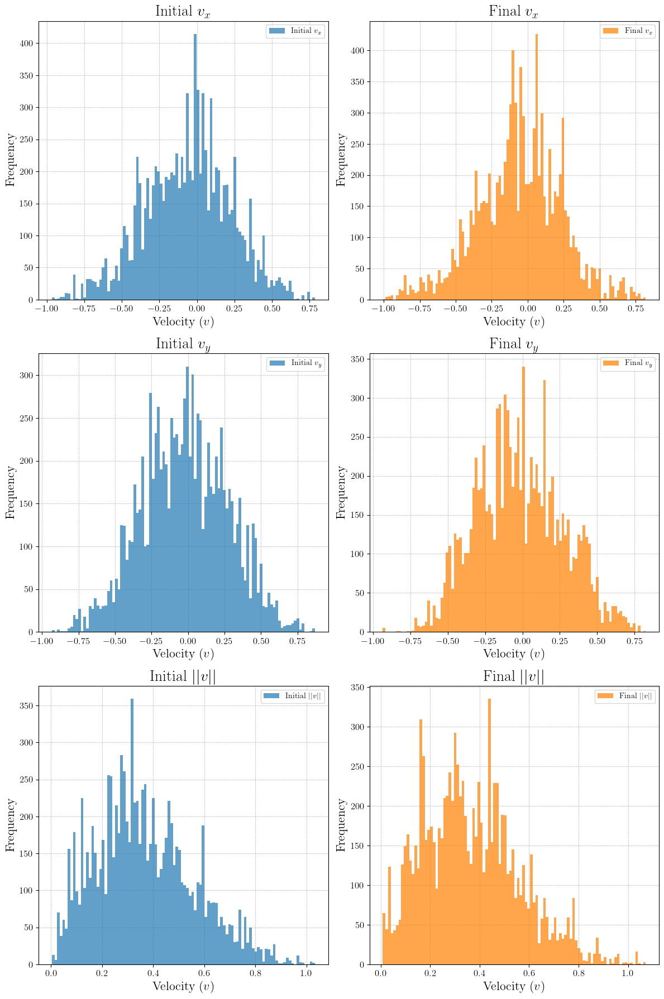

In [54]:
fig, axes = plt.subplots(3, 2, figsize=(12, 18))
bins = 100

axes[0, 0].hist(vx_initial, bins=bins, color='#1f78b4', alpha=0.7, label='Initial $v_x$', zorder=2)
axes[0, 1].hist(vx_final, bins=bins, color='#ff7f00', alpha=0.7, label='Final $v_x$', zorder=2)
axes[1, 0].hist(vy_initial, bins=bins, color='#1f78b4', alpha=0.7, label='Initial $v_y$', zorder=2)
axes[1, 1].hist(vy_final, bins=bins, color='#ff7f00', alpha=0.7, label='Final $v_y$', zorder=2)
axes[2, 0].hist(norm_initial, bins=bins, color='#1f78b4', alpha=0.7, label='Initial $||v||$', zorder=2)
axes[2, 1].hist(norm_final, bins=bins, color='#ff7f00', alpha=0.7, label='Final $||v||$', zorder=2)

for ax in axes.flatten():
    ax.set_xlabel('Velocity ($v$)')
    ax.set_ylabel('Frequency')
    ax.legend()
    ax.grid(True, linestyle='--', linewidth=0.5, zorder=0)  # Explicitly setting zorder=0 for the grid

axes[0, 0].set_title('Initial $v_x$')
axes[0, 1].set_title('Final $v_x$')
axes[1, 0].set_title('Initial $v_y$')
axes[1, 1].set_title('Final $v_y$')
axes[2, 0].set_title('Initial $||v||$')
axes[2, 1].set_title('Final $||v||$')

plt.tight_layout()
plt.show()


The plots obtained make sense; the 1-dimensional form of a Maxwell-Boltzmann equation is simply a Gaussian, centered at zero.

$$ f(v) = \sqrt{\frac{m}{2\pi k T}} e^{-\frac{mv^2}{2kT}}$$

In two-dimensions, this becomes:
$$ f(v) = \left( \frac{m}{2\pi k T} \right) 2\pi v e^{-\frac{mv^2}{2kT}}$$ 

Observations from the plot:
1. The distributions for the x and y components of velocity are symmetric about the $y$-axis (i.e., centered at 0).
2. The most probable velocity from the distribution of the velocity 'norm', is between 0.2 and 0.4.
The final velocities (norm) in the plot looks more evenly distributed.

Generating (in ChatGPT) a code snippet for plotting the general forms of these two functions:

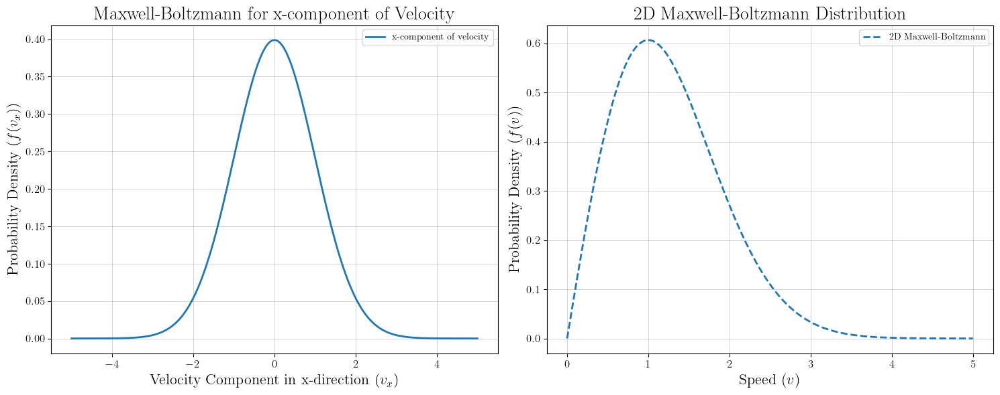

In [55]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

v_x = np.linspace(-5, 5, 500)
v = np.linspace(0, 5, 500)
m = 1.0  # arbitrary mass unit for demonstration
k = 1.0  # arbitrary Boltzmann constant unit for demonstration
T = 1.0  # arbitrary temperature unit for demonstration

f_x = np.sqrt(m / (2 * np.pi * k * T)) * np.exp(- m * v_x**2 / (2 * k * T))
f_2D = (m / (2 * np.pi * k * T)) * 2 * np.pi * v * np.exp(- m * v**2 / (2 * k * T))

axs[0].plot(v_x, f_x, label='x-component of velocity', linewidth=2)
axs[0].set_title('Maxwell-Boltzmann for x-component of Velocity')
axs[0].set_xlabel(r'Velocity Component in x-direction ($v_x$)')
axs[0].set_ylabel(r'Probability Density ($f(v_x)$)')
axs[0].grid(True)
axs[0].legend()

axs[1].plot(v, f_2D, label='2D Maxwell-Boltzmann', linestyle='--', linewidth=2)
axs[1].set_title('2D Maxwell-Boltzmann Distribution')
axs[1].set_xlabel(r'Speed ($v$)')
axs[1].set_ylabel(r'Probability Density ($f(v)$)')
axs[1].grid(True)
axs[1].legend()

plt.tight_layout()
plt.show()


This is exactly the nature of the histograms we see above.

### Repeating for $|\vec{v}| = 1.0$ nm/step.

In [56]:
num_steps = 2000
v_magn=1.0
data_traj, anim = do_the_simulation(box=[20,20],num_particles=50,steps=num_steps,v_norm=v_magn)

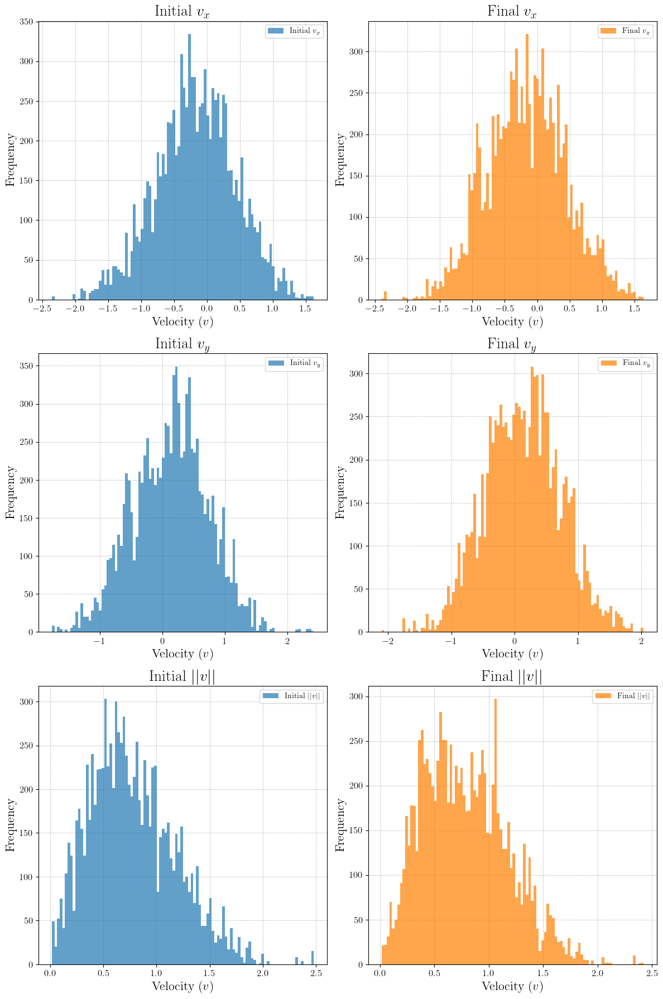

In [58]:
idx_v_f10 = int(0.1 * num_steps)
idx_v_l10 = int(0.9 * num_steps)

vx_initial = data_traj[:, 2, :idx_v_f10]
vy_initial = data_traj[:, 3, :idx_v_f10]
vx_final = data_traj[:, 2, idx_v_l10:-1]
vy_final = data_traj[:, 3, idx_v_l10:-1]

norm_initial = np.sqrt(vx_initial**2 + vy_initial**2)
norm_final = np.sqrt(vx_final**2 + vy_final**2)

vx_initial = vx_initial.flatten()
vy_initial = vy_initial.flatten()

vx_final = vx_final.flatten()
vy_final = vy_final.flatten()

norm_initial = norm_initial.flatten()
norm_final = norm_final.flatten()

fig, axes = plt.subplots(3, 2, figsize=(12, 18))
bins = 100

axes[0, 0].hist(vx_initial, bins=bins, color='#1f78b4', alpha=0.7, label='Initial $v_x$', zorder=2)
axes[0, 1].hist(vx_final, bins=bins, color='#ff7f00', alpha=0.7, label='Final $v_x$', zorder=2)
axes[1, 0].hist(vy_initial, bins=bins, color='#1f78b4', alpha=0.7, label='Initial $v_y$', zorder=2)
axes[1, 1].hist(vy_final, bins=bins, color='#ff7f00', alpha=0.7, label='Final $v_y$', zorder=2)
axes[2, 0].hist(norm_initial, bins=bins, color='#1f78b4', alpha=0.7, label='Initial $||v||$', zorder=2)
axes[2, 1].hist(norm_final, bins=bins, color='#ff7f00', alpha=0.7, label='Final $||v||$', zorder=2)

for ax in axes.flatten():
    ax.set_xlabel('Velocity ($v$)')
    ax.set_ylabel('Frequency')
    ax.legend()
    ax.grid(True, linestyle='--', linewidth=0.5, zorder=0)  # Explicitly setting zorder=0 for the grid

axes[0, 0].set_title('Initial $v_x$')
axes[0, 1].set_title('Final $v_x$')
axes[1, 0].set_title('Initial $v_y$')
axes[1, 1].set_title('Final $v_y$')
axes[2, 0].set_title('Initial $||v||$')
axes[2, 1].set_title('Final $||v||$')

plt.tight_layout()
plt.show()


The evident change in the distributions now, is that the velocity norm distribution looks steeper than the previous case  (initially). Then the distribution again looks more even (comparatively) in the final part of the trajectory.